In [68]:
import pandas as pd

Lam sach du lieu

In [69]:
df = pd.read_csv('vgsales.csv', usecols = ['Genre', 'Publisher'])
df_new = df.drop_duplicates().iloc[:-1500]
df_new

,Genre,Publisher
0,Sports,Nintendo
1,Platform,Nintendo
2,Racing,Nintendo
4,Role-Playing,Nintendo
5,Puzzle,Nintendo
...,...,...
2585,Strategy,Banpresto
2596,Action,20th Century Fox Video Games
2598,Adventure,Avanquest Software
2604,Simulation,Hudson Entertainment


Chuyen doi thanh do thi 2 phia va 1 phia

In [70]:
import networkx as nx
from networkx.algorithms import bipartite
g_1 = nx.Graph()
publishers = df_new['Publisher']
genres = df_new['Genre']
print("Number of publishers: ", publishers.nunique())
print("Number of genres: ", genres.nunique())
print("Number of edges: ", len(df_new))

Number of publishers:  123
Number of genres:  12
Number of edges:  337


In [71]:
for index, row in df_new.iterrows():
    g_1.add_edge(row['Genre'], row['Publisher'], weight = 1)
    g_1.add_nodes_from(genres, bipartite = 0)
    g_1.add_nodes_from(publishers, bipartite = 1)

<Figure size 1500x1500 with 0 Axes>

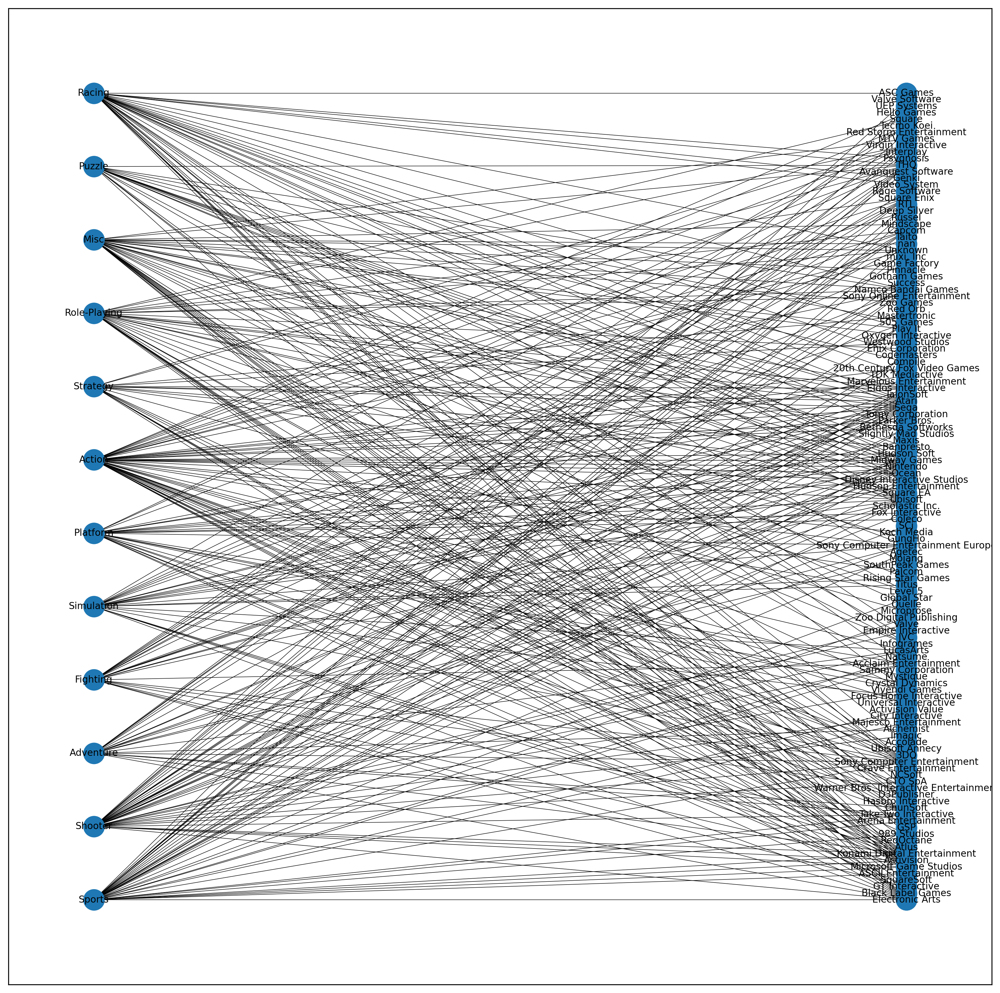

In [72]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
pos = nx.spring_layout(g_1)
fig, ax = plt.subplots(1, 1, figsize = (15, 15), dpi = 300)
nx.draw_networkx(g_1, pos = nx.drawing.layout.bipartite_layout(g_1, genres), font_size = 8, width = 0.4)

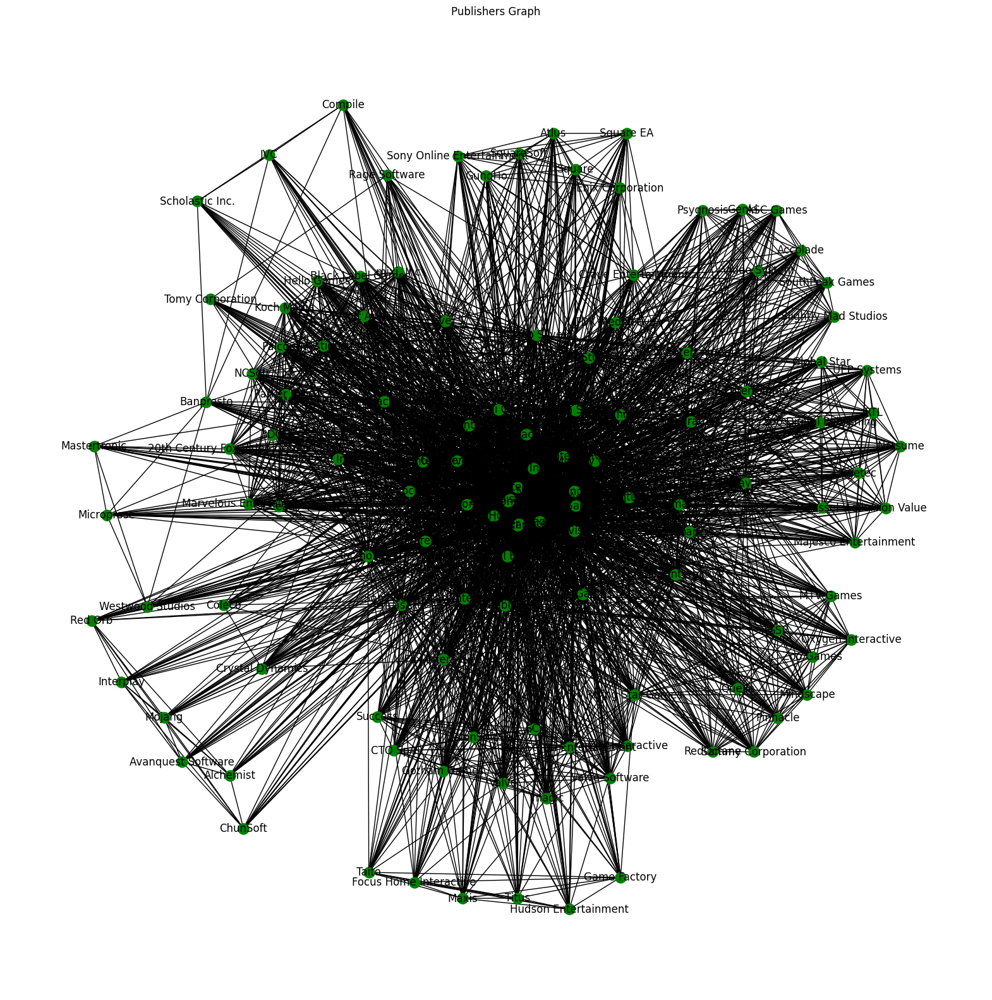

In [73]:
# Remove duplicated publishers from rows of dataframe:
final_publishers = publishers.drop_duplicates()
g_2 = bipartite.weighted_projected_graph(g_1, final_publishers)
plt.figure(figsize = (20, 20))

layout = nx.spring_layout(g_2)

nx.draw_networkx_nodes(
    g_2,
    layout,
    nodelist = final_publishers,
    node_size = 150,
    node_color = 'green'
)
nx.draw_networkx_edges(g_2, layout, edge_color = '#000000')
node_labels = dict(zip(final_publishers, final_publishers))
nx.draw_networkx_labels(g_2, layout, labels = node_labels)
plt.axis('off')
plt.title('Publishers Graph')

plt.show()
